# Task 21: Random Forests
### "In this task, we will continue with the Decision_Trees.ipynb Notebook created in the previous task."

## Please note
The immediate content below is for Task 20.

Following feedback, I have dropped null Age values from the dataset in the Task 20 section.  As a result, the markdown observations of this data in the Task 20 section are erroneous.  I have left these in as they are not assessed in this task.  It would probably be best to start a new Notebook, including just relevant code and information to this task, but the instructions say to continue with the existing Notebook from the previous task.

Scroll down to "Task 21: Practical Task" for tasks specific to Task 21


### Create a decision tree that can predict the survival of passengers on the Titanic. Make sure not to impose any restrictions on the depth of the tree.
### Use the decision_tree_titanic.ipynb file provided, which has the titanic.csv dataset loaded to complete the task
Data has already been loaded and encoded below

In [1]:
import pandas as pd

In [2]:
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [4]:
# You can also drop whichever other columns you'd like here
titanic_df.drop("Cabin", axis=1, inplace=True)

# Columns dropped from dataframe lower down, so as to keep my section of code together

### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [5]:
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [6]:
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"])
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Embarked,Sex_female,Sex_male
0,1,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,S,False,True
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,C,True,False
2,3,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,S,True,False
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,S,True,False
4,5,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,S,False,True


Now, we do the same to the "Embarked" column.

In [7]:
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"])
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,False,True,False,False,True
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,True,False,True,False,False
2,3,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,True,False,False,False,True
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,True,False,False,False,True
4,5,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,False,True,False,False,True


## Tasks
### Select relevant variables from the data and split the data into a training, development, and test set.
Importing libraries other than Pandas, which was imported at the start

In [8]:
from sklearn.model_selection import train_test_split  # Will be used to split data: Training, Development and Test
from sklearn.tree import DecisionTreeClassifier  # Used to create decision tree model
from sklearn import tree  # Used to visualise decision tree
import matplotlib.pyplot as plt  # Used to plot the deccision tree
from sklearn.metrics import accuracy_score  # used to calculate accuracy score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay  # Used to generate and display confusion matrix

Dropping PassengerId, Name and Ticket from the dataframe, as these are non-numeric, cannot easily be classified and are not useful to the analysis.

As mentioned in earlier comments, this action was not done when Cabin was dropped, simply so that I could keep together all the code that I have written.

In [9]:
titanic_df.drop(columns=['PassengerId','Name','Ticket'],axis=1, inplace=True)  # Dropping features that are not useful
titanic_df.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,False,True,False,False,True
1,1,1,38.0,1,0,71.2833,True,False,True,False,False
2,1,3,26.0,0,0,7.9250,True,False,False,False,True
3,1,1,35.0,1,0,53.1000,True,False,False,False,True
4,0,3,35.0,0,0,8.0500,False,True,False,False,True


In [10]:
print(titanic_df.isnull().sum())

Survived        0
Pclass          0
Age           177
SibSp           0
Parch           0
Fare            0
Sex_female      0
Sex_male        0
Embarked_C      0
Embarked_Q      0
Embarked_S      0
dtype: int64


I am dropping the records with null value for Age, as i don't know what relation these missing values have with other variables.

In [11]:
titanic_df = titanic_df.dropna()
titanic_df.shape

(714, 11)

The dependent variable is 'Survived', to be stored in y.

The remaining variables are independent, to be stored in X.

In [12]:
X = titanic_df.drop(columns=['Survived']) # Selecting all remaining features except 'Survived'
y = titanic_df['Survived'] # Selectig 'Survived' as the dependent variable
X.shape

(714, 10)

Splitting the data into a training, development and test set.  As there are 891 records, I am splitting the data 80/20 to generate a 20% test set.  The other 80% will be split 80/20 between training data and development data respectively.

In [13]:
# Split the data, creating a test set (size 20%)
X_majority, X_test, y_majority, y_test = train_test_split(X, y,test_size=0.2, random_state=42)
# Split the data not in the test set between a training set (80%) and a development set (20%)
X_train, X_dev, y_train, y_dev = train_test_split(X_majority,y_majority, test_size=0.2, random_state=42)
X_train.shape, X_dev.shape, X_test.shape # Checking the hape/size of the set

((456, 10), (115, 10), (143, 10))

### Train a decision tree and make a plot of it.
Training the decision tree

In [14]:
# Create a decision tree model
unpruned = DecisionTreeClassifier(random_state=42)

# Train model on training set data
unpruned.fit(X_train,y_train)

# Predict outcomes for training and development data
y_train_pred = unpruned.predict(X_train)
y_dev_pred = unpruned.predict(X_dev)

Making a plot of the decision tree

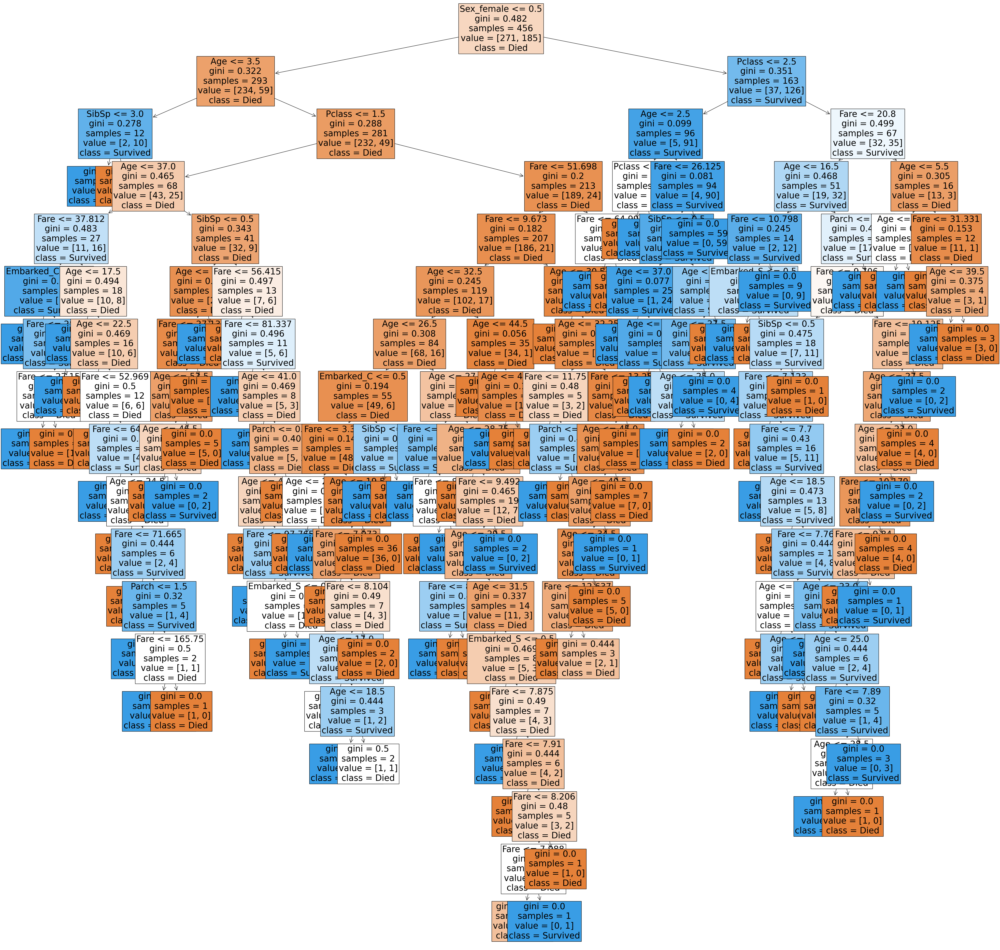

In [15]:
plt.figure(figsize=(50,50))  # Depth of 50 to display nodes more clearly
features = X.columns  # Column headings used to show feature in the condition
classes = ['Died','Survived']  # Predicted outcome label
tree.plot_tree(unpruned,feature_names=features,class_names=classes,filled=True,fontsize=25)
plt.show()

### Compute your model’s accuracy on the development set.

In [16]:
print('ACCURACY...')
print('Training', accuracy_score(y_train, y_train_pred))  # Display accuracy on training data
print('Development', accuracy_score(y_dev, y_dev_pred))  # Display accuracy on development data
print("\nMAX DEPTH:", unpruned.tree_.max_depth)  # Diplays max depth of model

ACCURACY...
Training 0.9912280701754386
Development 0.7739130434782608

MAX DEPTH: 17


Displaying confuion matrices for training and development data for further overview of accuracy

Text(0.5, 1.0, 'Confusion Matrix - Development Data')

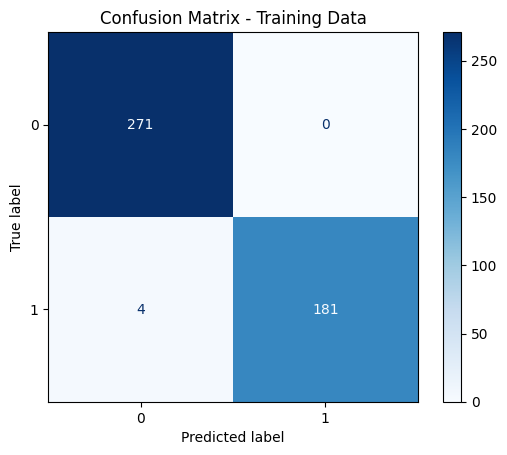

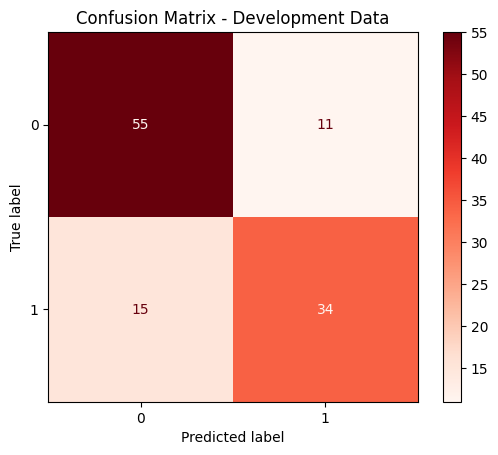

In [17]:
cm = confusion_matrix(y_train, y_train_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=unpruned.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix - Training Data')

cm = confusion_matrix(y_dev, y_dev_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=unpruned.classes_)
disp.plot(cmap='Reds')
plt.title('Confusion Matrix - Development Data')

### Try building your model with different values of max_depth (2–10). At each step, create a plot of your tree and store the accuracies on both the training and development data.
Creating a for loop to iterate through the required values of max_depth.  Each iteration builds a model with the value of max_depth, plots the decision tree, displays accuracy data, and appends data to list of max depth, training data set accuracy and development data set accuracy.

MAX DEPTH = 2


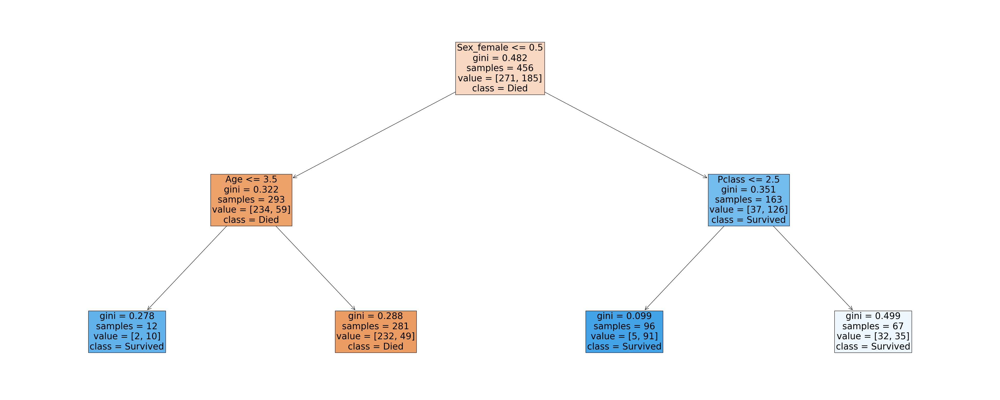

At max depth: 2
Training data accuracy is 0.8070175438596491
Development data accuracy is 0.8
---------------------------------------------------

MAX DEPTH = 3


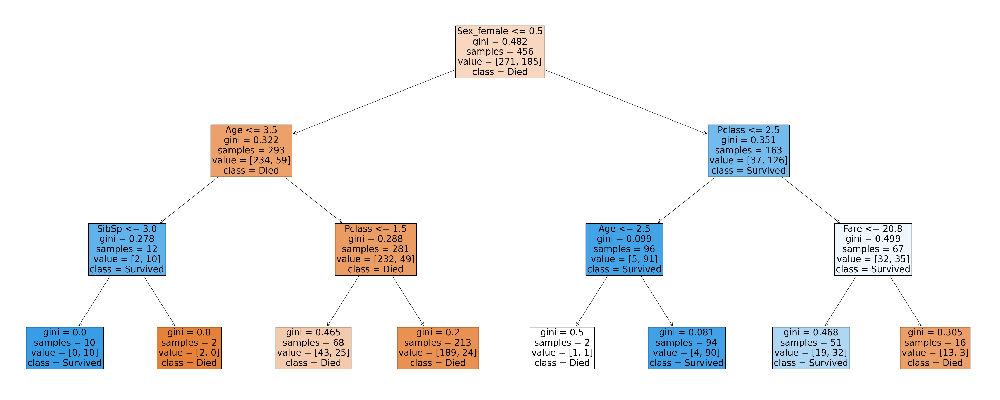

At max depth: 3
Training data accuracy is 0.8333333333333334
Development data accuracy is 0.808695652173913
---------------------------------------------------

MAX DEPTH = 4


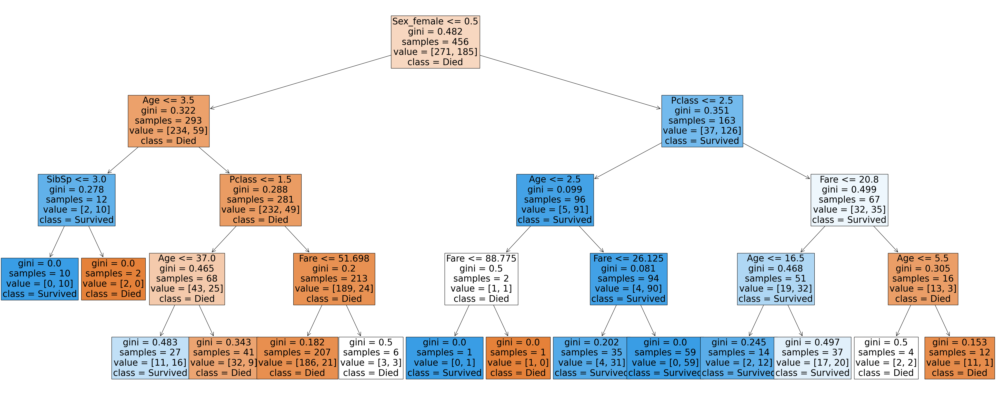

At max depth: 4
Training data accuracy is 0.8464912280701754
Development data accuracy is 0.808695652173913
---------------------------------------------------

MAX DEPTH = 5


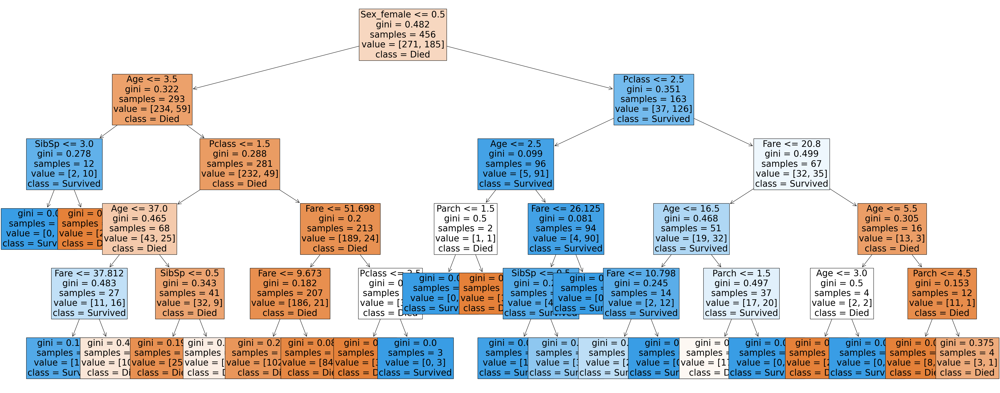

At max depth: 5
Training data accuracy is 0.8640350877192983
Development data accuracy is 0.8521739130434782
---------------------------------------------------

MAX DEPTH = 6


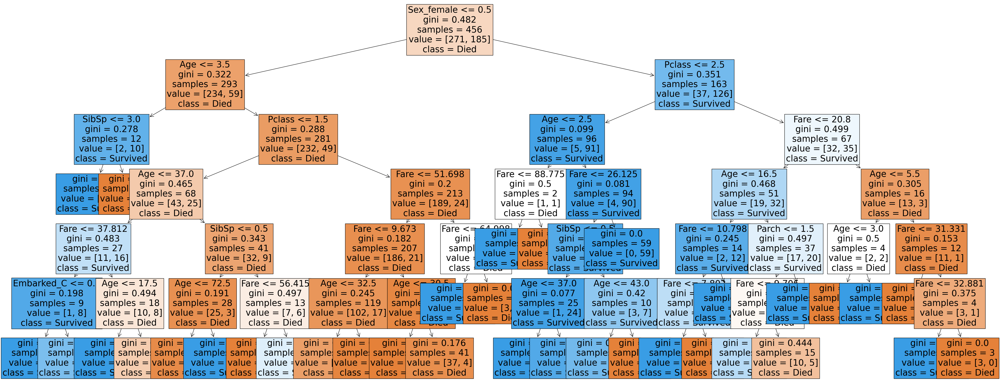

At max depth: 6
Training data accuracy is 0.8903508771929824
Development data accuracy is 0.8260869565217391
---------------------------------------------------

MAX DEPTH = 7


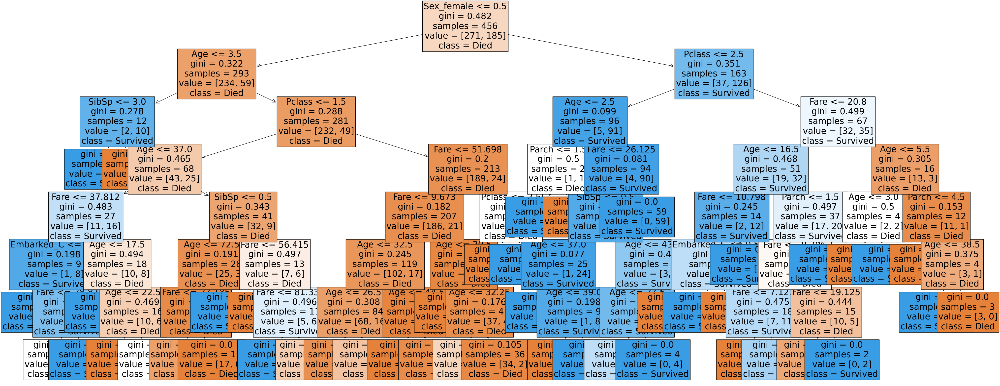

At max depth: 7
Training data accuracy is 0.9035087719298246
Development data accuracy is 0.8347826086956521
---------------------------------------------------

MAX DEPTH = 8


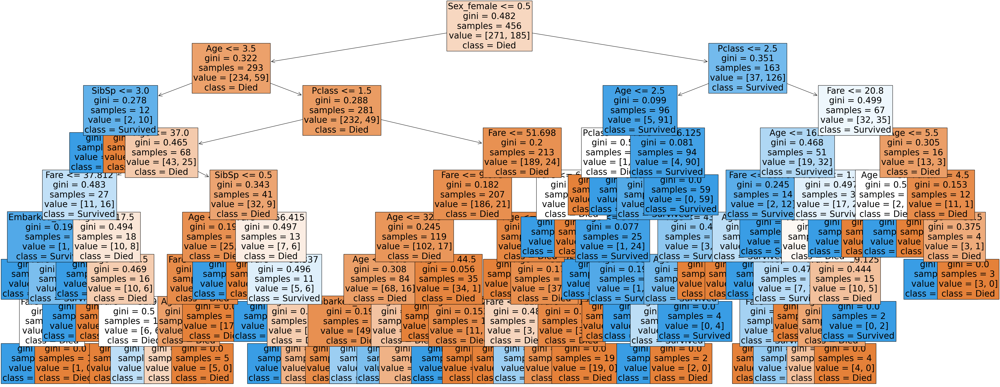

At max depth: 8
Training data accuracy is 0.9298245614035088
Development data accuracy is 0.7652173913043478
---------------------------------------------------

MAX DEPTH = 9


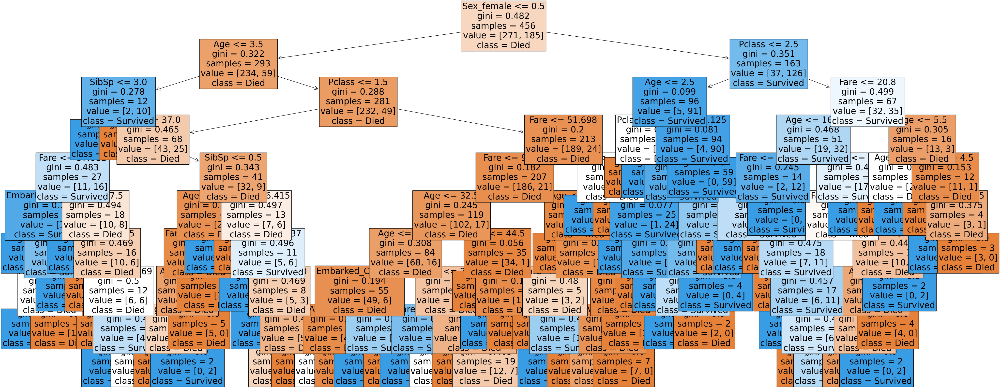

At max depth: 9
Training data accuracy is 0.9429824561403509
Development data accuracy is 0.7913043478260869
---------------------------------------------------

MAX DEPTH = 10


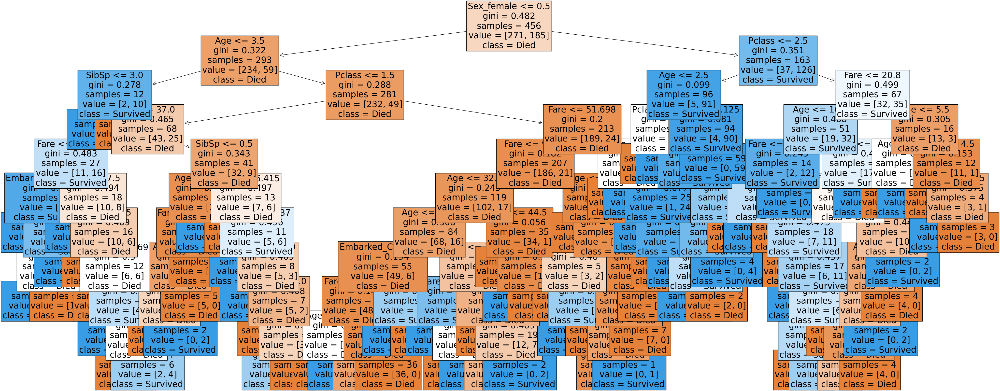

At max depth: 10
Training data accuracy is 0.9627192982456141
Development data accuracy is 0.7739130434782608
---------------------------------------------------



In [18]:
# Creates empty lists to populate
depth = []
train_accuracies = []
dev_accuracies =[]
# Iterates through the requested range of max depths - ploting decision tree and displaying accuracy for each
for x in range(2,11):  
    print('MAX DEPTH =', x)
    pruned = DecisionTreeClassifier(max_depth=x, random_state=42) # Create a decision tree model
    pruned.fit(X_train,y_train)  # Train model on training set data
    # Predict outcomes for training and development data
    y_train_pred = pruned.predict(X_train)
    y_dev_pred = pruned.predict(X_dev)
    # Plot the decision tree
    plt.figure(figsize=(50,20))
    features = X.columns  # Column headings used to show feature in the condition
    classes = ['Died','Survived']  # Predicted outcome label
    tree.plot_tree(pruned,feature_names=features,class_names=classes,filled=True,fontsize=25)
    plt.show()
    acc_train = accuracy_score(y_train, y_train_pred)  # Accuracy of training predction
    acc_dev = accuracy_score(y_dev, y_dev_pred)  # Accuracy of development prediction
    print ('At max depth:', x)
    print ('Training data accuracy is', acc_train)
    print ('Development data accuracy is', acc_dev)
    print ('---------------------------------------------------')  # Print lines to neated display
    print ()
    # max depth, acc_train and acc_dev appended to lists
    depth.append(x)
    train_accuracies.append(acc_train)
    dev_accuracies.append(acc_dev)


### Plot a line of your training accuracies and another of your development accuracies in the same graph. Write down what shape the lines have and what this shape means.

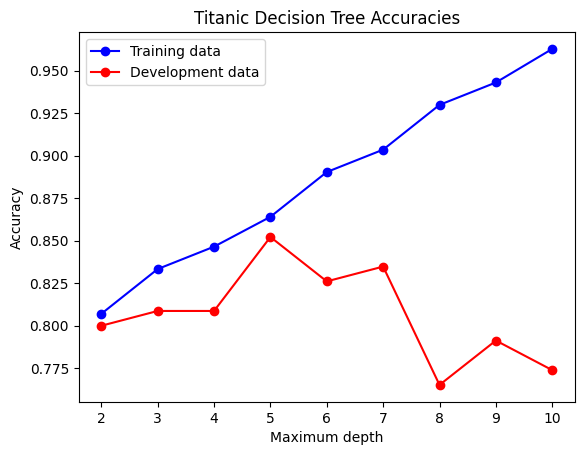

In [19]:
plt.title("Titanic Decision Tree Accuracies")  # Chart title
plt.xlabel("Maximum depth")  # X axis label
plt.ylabel("Accuracy")  # Y axis label
plt.plot(depth, train_accuracies, color = 'b', marker ='o', label = 'Training data')  # Plot training data in blue with markers
plt.plot(depth, dev_accuracies, color = 'r', marker = 'o', label = "Development data") # Plot development data in red with markers
plt.legend()  # Show legend to denify curves
plt.show()

The training data line has a fairly steady increase from 0.80 (max depth 2) to close to 0.94 (max depth 10).  This shows increased accuracy on the training set as complexity (number of nodes) is increased.  This is to be expected.  The biggest increase is from max depth 2 to max depth 3.

The development data initially increases when max depth is increased, but peaks at max depth 3 & 4.  It then falls, before rising slightly towards 9, and then drops to 10.  Before 3 there is underfitting, and after 4 there is overfitting.  The improvement from 6 to 9 is interesting, and perhaps warrant further investigation, but it may well just be a quirk of the data.

As there is identical accuracy for maximum depth 3 and 4, I need to decide between the two of them for my final model.  If the max depth figures were high, I would choose the lower one to decrease complexity.  But as they are low, I am choosing the higher max depth (4), because of the greater accuracy on the training data (and therefore greater accuracy on all data tested).

Max depth of 4 is significantly below the mx depth figure for the unpruned model (21).
### Report the accuracy of your final model on the test data

In [20]:
pruned = DecisionTreeClassifier(max_depth=4, random_state=42) # Create a decision tree model with max depth set to 4
pruned.fit(X_train,y_train)  # Train model on training set data
# Predict outcomes for training, development and testing data
y_train_pred = pruned.predict(X_train)
y_dev_pred = pruned.predict(X_dev)
y_test_pred = pruned.predict(X_test)
print(f'The accuracy of the model on the test data is {accuracy_score(y_test, y_test_pred)}.')
print(f'This compares to {accuracy_score (y_train, y_train_pred)} for the train data and {accuracy_score(y_dev, y_dev_pred)} for the development data.')


The accuracy of the model on the test data is 0.7692307692307693.
This compares to 0.8464912280701754 for the train data and 0.808695652173913 for the development data.


There is lower accuracy for the tet data set (0.799).  I have experimented in changing the max depth figure and found that the value would have been the same if I had chosen max depth of 3.  It would be slightly higher with a max depth of 5 (0.810), but this still below the peak for the development data.

Finally I am displaying the confusion matrices for the model on these data sets at max depth of 4.

Text(0.5, 1.0, 'Confusion Matrix - Testing Data')

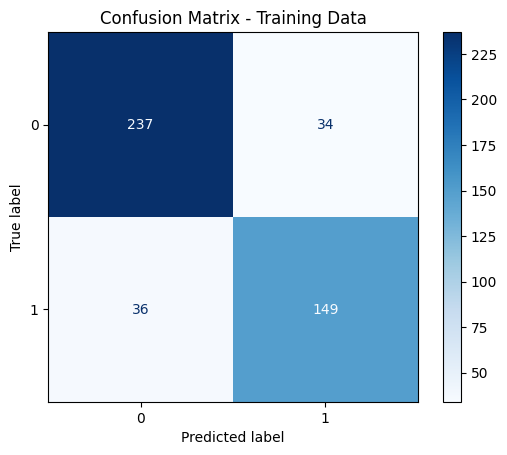

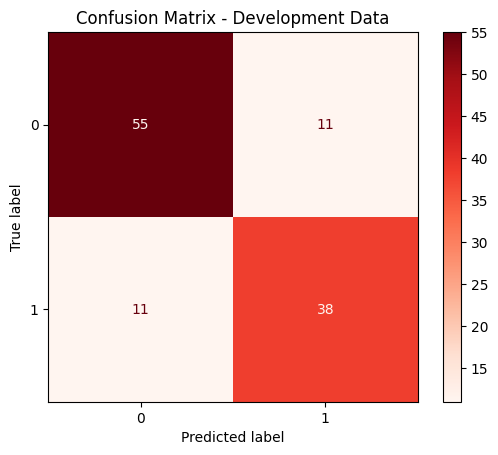

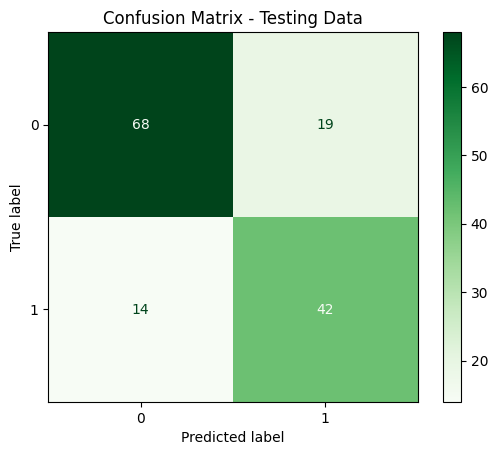

In [21]:
cm = confusion_matrix(y_train, y_train_pred, labels=pruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned.classes_)
disp.plot(cmap='Blues')
plt.title('Confusion Matrix - Training Data')

cm = confusion_matrix(y_dev, y_dev_pred, labels=pruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned.classes_)
disp.plot(cmap='Reds')
plt.title('Confusion Matrix - Development Data')

cm = confusion_matrix(y_test, y_test_pred, labels=pruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned.classes_)
disp.plot(cmap='Greens')
plt.title('Confusion Matrix - Testing Data')

# Task 21: Practical Task

### "Create a bagged, random forest, and boosted tree for the Titanic data set in the same way that you created a regular classification tree."
Importing libraries not imported earlier

In [22]:
# importing classifiers from ensemble module
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier # Not used due to null values in data
from sklearn.ensemble import HistGradientBoostingClassifier
# importing GridSearchCV to identify best parameters
from sklearn.model_selection import GridSearchCV


Creating bagged ensemble:

In [23]:
# This is an unnecessary repeat of an earlier process, but I have included it here to help facilitate changes in the random state
r=42
pruned = DecisionTreeClassifier(max_depth=5, random_state=r)  # Creating the decision tree model, max_depth set at optimum level from task 20
pruned.fit(X_train,y_train)  # Train model on training set data

# Using the 'pruned' decision tree classifier model as per Task 20
# Max depth is set to 4 in this model as that was found to be the optimum value
ensemble = BaggingClassifier(estimator=pruned, n_estimators=100, random_state=r)  # Creating a bagged ensemble model
ensemble.fit(X_train,y_train)  # Fitting the model to the training data

print("PRUNED TREE") # Printing accuracy scores for the pruned tree
print("Accuracy on training set:",pruned.score(X_train, y_train))
print("Accuracy on development set:",pruned.score(X_dev, y_dev))
print()
print("BAGGED ENSEMBLE") # Printing accuracy scores for the bagged ensemble
print("Accuracy on training set:",ensemble.score(X_train, y_train))
print("Accuracy of developent set:",ensemble.score(X_dev, y_dev))

PRUNED TREE
Accuracy on training set: 0.8640350877192983
Accuracy on development set: 0.8521739130434782

BAGGED ENSEMBLE
Accuracy on training set: 0.881578947368421
Accuracy of developent set: 0.8521739130434782


The ensemble model has greater accuracy in predictions on the training set, but the same on the development set 

Creating a random forest:

In [24]:
rf = RandomForestClassifier(n_estimators=100, random_state=r)  # Creating the random forest model
rf.fit(X_train, y_train)  # Fitting the model to the training data

print("RANDOM FOREST")  # Printing accuracy scores for the random forest
print("Accuracy on training set:",rf.score(X_train, y_train))
print("Accuracy on development set:",rf.score(X_dev, y_dev))

RANDOM FOREST
Accuracy on training set: 0.9912280701754386
Accuracy on development set: 0.782608695652174


The random forest model has greater accuracy than either previous model on the training set, but a lower accuracy on the development set.

Creating a boosted tree:

In [25]:
boost = AdaBoostClassifier(n_estimators=100, random_state=r) # Creating the boosted model
#boost = HistGradientBoostingClassifier(max_iter=100)  --- alternative boosting model used when including null values
boost.fit(X_train, y_train)  # Fitting the model to the training data

print("BOOSTED TREE")  # Printing accuracy scores for the boosted tree
print("Accuracy on training set:",boost.score(X_train, y_train))
print("Accuracy on development set:",boost.score(X_dev, y_dev))

c:\Users\debbi\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


BOOSTED TREE
Accuracy on training set: 0.8596491228070176
Accuracy on development set: 0.8260869565217391


The boosted tree has lower accuracy than the random forest for the training data, and but higher accuracy on the development set.  The accuracy on the development set is lower than the bagged ensemble but higher than the pruned tree.
### "From the random forest model, determine which of the features is the one that contributes the most to predicting whether a passenger survives or not."

In [26]:
# Printing importances of features is descending order
importances = pd.DataFrame({'Feature': X.columns, 'Importance': rf.feature_importances_}).sort_values('Importance', ascending=False)
importances

,Feature,Importance
1,Age,0.280763
4,Fare,0.225268
6,Sex_male,0.167751
5,Sex_female,0.135241
0,Pclass,0.079090
3,Parch,0.039503
2,SibSp,0.038658
7,Embarked_C,0.014806
9,Embarked_S,0.012930
8,Embarked_Q,0.005990


The feature that contributes most to predicting whether a passenger survives or not is 'Age' with 0.281 importance. This is the only feature that had missing values (177 missing values out of 891 records).  These null value records have been removed from the dataset earlier.
### "Pick one of these methods, and tune the parameters n_estimators and max_depth."
Although the boosted method has returned higher accuracy values on the developmnet set compared to the random forest model, I am choosing the random forest method to tune.  This is in part because lectures and tutorials have focused on random forests and only looked at boosted trees from a theoretical perspective.

In [27]:
# Random forest model ('rf') has previously been created and fitted to the training data

parameters = {'n_estimators': [10,20,30,50,100,200,400], 'max_depth': [2,3,5,10,20]}

# Creating the GridSearch model
grid_search = GridSearchCV(estimator=rf, param_grid=parameters, cv = 3, n_jobs=-1, verbose=1, scoring="r2")
grid_search.fit(X_train, y_train)  # Fitting the model to the training data
grid_search.best_estimator_  # Displays the best values


Fitting 3 folds for each of 35 candidates, totalling 105 fits


RandomForestClassifier(max_depth=10, n_estimators=20, random_state=42)

The best results are for max_depth=10 and n_estimators=20.  I will repeat the exercise with parameters around these values to see if I can find better results.

In [28]:
parameters = {'n_estimators': [15,18,20,22,25], 'max_depth': [7,10,12,15]}

# Creating the GridSearch model
grid_search = GridSearchCV(estimator=rf, param_grid=parameters, cv = 3, n_jobs=-1, verbose=1, scoring="r2")
grid_search.fit(X_train, y_train)  # Fitting the model to the training data
grid_search.best_estimator_  # Display best values

Fitting 3 folds for each of 20 candidates, totalling 60 fits


RandomForestClassifier(max_depth=10, n_estimators=18, random_state=42)

The best results are now for max_depth=10 and n_estimators=18.  I will repeat the exercise one final time with values adjacent to these.

In [29]:
parameters = {'n_estimators': [17,18,19], 'max_depth': [9,10,11]}

# Creating the GridSearch model
grid_search = GridSearchCV(estimator=rf, param_grid=parameters, cv = 3, n_jobs=-1, verbose=1, scoring="r2")
grid_search.fit(X_train, y_train)  # Fitting the model to the training data
grid_search.best_estimator_  # Display best values

Fitting 3 folds for each of 9 candidates, totalling 27 fits


RandomForestClassifier(max_depth=10, n_estimators=18, random_state=42)

Again, the best results are for max_depth=10 and n_estimators=18.

In [30]:
# Using the random forest model with the best results
rf = RandomForestClassifier(n_estimators=18, max_depth=10,random_state=r)
rf.fit(X_train, y_train)

print("RANDOM FOREST")  # Displaying accuracy of model
print("Accuracy on training set:",rf.score(X_train, y_train))
print("Accuracy on development set:",rf.score(X_dev, y_dev))

RANDOM FOREST
Accuracy on training set: 0.9539473684210527
Accuracy on development set: 0.8


### "Report the accuracy of all models and report which model performed the best, including the values for n_estimators and max_depth that the best model had."
I am firstly comparing the accuracies of each of the sets of best parameters found through the first GridSearch (n_estimators=20, max_depth=10), with the final best parameters found (n_estimators=18, max_depth=10)

In [31]:
# Using the random forest model with parameters from first GridSearch
rf_first = RandomForestClassifier(n_estimators=20, max_depth=10,random_state=r)
rf_first.fit(X_train, y_train)

print("MODEL (n-estimators/max_depth)   TRAINING     DEVELOPMENT")
print(f"First GridSearch (20/10)\t ",round(rf_first.score(X_train, y_train),3),"\t",rf_first.score(X_dev, y_dev))
print(f"Final GridSearch (18/10)\t ",round(rf.score(X_train, y_train),3),"\t",rf.score(X_dev, y_dev))

MODEL (n-estimators/max_depth)   TRAINING     DEVELOPMENT
First GridSearch (20/10)	  0.958 	 0.8
Final GridSearch (18/10)	  0.954 	 0.8


Interestingly the first GridSearch parameters give slightly better results for the Training data.  Both have identical accuracy for the Development data.  However, an increase in accuracy on the Training set of just 0.004 does not seem significant, and so I believe the best option is the final GridSearch - virtually the same results, but use of fewer n_estimators.  So my opinion is that the best model has the parameters n_estimators=18, max_depth=10.

In [32]:
print("Accuracy of the models")
print("MODEL\t\t TRAINING   DEVELOPMENT")

models = (pruned,ensemble,boost,rf)
labels = ('Pruned Tree','Bagged Ensemble','Boosted Tree','Random Forest')

#  Display accuracy to 3 d.p. on training, developing and testing sets for each model
for z in range(4):
    train = round(models[z].score(X_train, y_train),3)
    dev = round(models[z].score(X_dev, y_dev),3)
    print (f"{labels[z]}\t   {train} \t{dev}")


Accuracy of the models
MODEL		 TRAINING   DEVELOPMENT
Pruned Tree	   0.864 	0.852
Bagged Ensemble	   0.882 	0.852
Boosted Tree	   0.86 	0.826
Random Forest	   0.954 	0.8


The random forest model with max_depth = 10 and n_estimators = 18 performed best on the training set, with an accuracy score of 0.954. However, it was the lowest performing on the development sets.  

The highest performing on both sets was the Bagged Ensemble, and so I am investigating different parameters for this model.

In [33]:
depth = [4,5,10]  # These are the best values of max depth I have found (4 in Task 20, 5 Task 20 repeat with null data dropped, 10 for random forest)
n_est = [20,50,100,150]  # A range around the current value of 100

for d in depth:
    print ("max_depth =",d)
    pruned = DecisionTreeClassifier(max_depth=d, random_state=r)
    for n in n_est:
        ensemble = BaggingClassifier(estimator=pruned, n_estimators=n, random_state=r)  # Creating a bagged ensemble model
        ensemble.fit(X_train,y_train)  # Fitting the model to the training data 
        print ("For",n,"estimates, Development accuracy is",round(ensemble.score(X_dev, y_dev),3))
    print()


max_depth = 4
For 20 estimates, Development accuracy is 0.835
For 50 estimates, Development accuracy is 0.826
For 100 estimates, Development accuracy is 0.835
For 150 estimates, Development accuracy is 0.835

max_depth = 5
For 20 estimates, Development accuracy is 0.843
For 50 estimates, Development accuracy is 0.835
For 100 estimates, Development accuracy is 0.852
For 150 estimates, Development accuracy is 0.843

max_depth = 10
For 20 estimates, Development accuracy is 0.8
For 50 estimates, Development accuracy is 0.791
For 100 estimates, Development accuracy is 0.791
For 150 estimates, Development accuracy is 0.8



max_depth = 5 outperforms the other values for all n_estimator values I have used.  The best n_estimate value is 100.  These best values are the ones that have been used earlier in the Notebook and result in the highest accuracy on the Development set out of all the models used.

At max_depth = 5, I am going to try n_estimators = 90 and 110, to see if there is any signigficant variance in accuracy.

In [34]:
n_est = [90,100,110]  # A range around the current value of 100

pruned = DecisionTreeClassifier(max_depth=5, random_state=r)
for n in n_est:
    ensemble = BaggingClassifier(estimator=pruned, n_estimators=n, random_state=r)  # Creating a bagged ensemble model
    ensemble.fit(X_train,y_train)  # Fitting the model to the training data 
    print ("For",n,"estimates, Development accuracy is",round(ensemble.score(X_dev, y_dev),3))


For 90 estimates, Development accuracy is 0.852
For 100 estimates, Development accuracy is 0.852
For 110 estimates, Development accuracy is 0.852


As there is no difference, I am sticking with n_estimators=100.

I am now going to check the each model with the Training, Development and Testing data to see overall accuracy.

In [35]:
pruned.fit(X_train,y_train)  # Fitting model - not done in above code
ensemble = BaggingClassifier(estimator=pruned, n_estimators=100, random_state=r)  # Creating a bagged ensemble model with n_estimators = 100
ensemble.fit(X_train,y_train)   # Fitting model

print("Accuracy of the models")
print("MODEL\t\t TRAINING   DEVELOPMENT\tTESTING")

models = (pruned,ensemble,boost,rf)
labels = ('Pruned Tree','Bagged Ensemble','Boosted Tree','Random Forest')

#  Display accuracy to 3 d.p. on training, developing and testing sets for each model
for z in range(4):
    train = round(models[z].score(X_train, y_train),3)
    dev = round(models[z].score(X_dev, y_dev),3)
    test = round(models[z].score(X_test, y_test),3)
    print (f"{labels[z]}\t   {train} \t{dev}\t  {test}")


Accuracy of the models
MODEL		 TRAINING   DEVELOPMENT	TESTING
Pruned Tree	   0.864 	0.852	  0.776
Bagged Ensemble	   0.882 	0.852	  0.755
Boosted Tree	   0.86 	0.826	  0.797
Random Forest	   0.954 	0.8	  0.741


## Summary
From the Development set, equal best models were the Bagged Ensemble with max_depth=5 and n_estimators=100, and just the single Pruned Tree (max_depth=5).

However, on applying the models to the Testing set the Boosted Tree performs best (and slightly better than the Bagged Ensemble when aggregating Developpment and Testing accuracy).  As such, there may be little 'real' variance in accuracy - a different random state might, for example, reverse the situation.

The worst performing on Development and Testing is the Random Forest, even with best parameters (max_depth=10, n_estimators=18).

For all models, performance was worse on the Testing data than on the Development data.
